## Predicting crime in Los Angeles
Capstone Project 1 - Step 2: Exploaroty Data Analysis

Notebook by Oliver Bohler


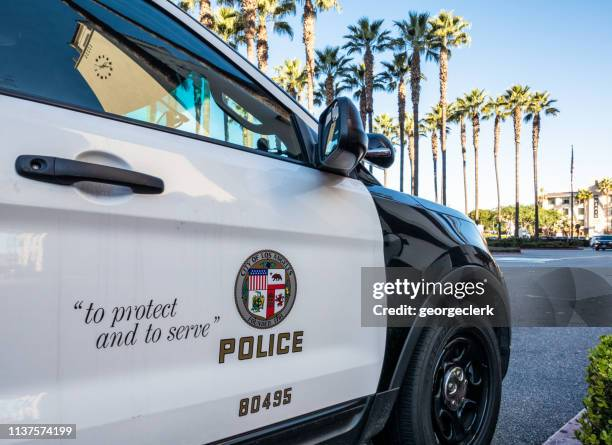

## The LAPD's major tech upgrade
When Mayor Karen Bass laid out her budget proposal for the Los Angeles Police Department last year, she had big plans for rebuilding the size of that agency’s workforce.

The mayor’s budget called for the LAPD to end the 2023-24 budget year with about 9,500 police officers — a target that would require the hiring of nearly 1,000 officers over a 12-month period.

Now, a new assessment from City Administrative Officer Matt Szabo — the city’s top budget analyst — shows the department is falling well short of its staffing goal. By June 30, the end of the fiscal year, the department is expected to have 8,908 officers, according to Szabo’s projections.

That would leave the LAPD with its lowest sworn staffing levels in over two decades.

The Los Angeles Police Department (LAPD) is gearing up to overhaul its old records with a brand new Records Management System (RMS) that will launch department-wide over the span of the year 2024.

The upgrade is part of a broader move to align with the Federal Bureau of Investigation's (FBI) National Incident-Based Reporting System (NIBRS) standards, which demands more granular and precise crime data reporting. "This cutting-edge RMS marks a crucial advancement, elevating our operational efficiency and data management practices." The RMS promises to save redundant information, amp up digitization, and offer increased centralized knowledge—meaning that officers and commanders can expect enhanced data access and improved abilities to investigate incidents.

Ahead of its launch, the LAPD is also highlighting the potential benefits of the RMS, including the ability for field interviews to be gathered via mobile devices, reducing the likelihood of reports being lost or misplaced, and providing primary officers with immediate access to gathered data. "Benefits of the new RMS available at launch," states the LAPD website, encompass a range of features aimed at both streamlining report completion and fostering robust investigations.

The NIBRS system, which has been the federal standard since January 2021, supports officer safety by providing quicker access to a fuller set of crime data and offers deeper insight into the context of crimes, profiles of victims and offenders, and a standardized framework for crime comparison across different jurisdictions.

## Import neccessary libraries and display settings

In [11]:
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Set Color Palette
GrayO = ["orange","black","gray", 'blue','red']
sns.set_palette(GrayO)

# Set Matplotlib display settings
%matplotlib inline
%config InlineBackend.figure_format='retina'
mpl.rcParams['figure.figsize'] = (16,8)

# Allow for wider and longer table display
pd.options.display.max_columns = 400
pd.options.display.max_rows = 400
# load in the data

crimes = '/Users/oliverbohler/Desktop/Springboard/capstone project 2 violent crime in los angeles/Crime_LA_2010_2023.csv'
crime = pd.read_csv(crimes)
crime.head()

,Date Occured,Time Occured,Area Name,Zone,Crime Code,year,month,day,Weekday,Crime Code Description,Vict Age,Crime Category,Vict Sex,Vict Descent,Premis Code,Premis Group,Premis Desc,Weapon Category,Weapon Used Cd,Weapon Desc,Status,Status Desc,Location,Lat,Lon
0,2010-01-02,21:00,Central,Hollywood/Greater Downtown Area,122,2010,1,2,Saturday,"RAPE, ATTEMPTED",47.0,Sexual Offenses,F,H,103.0,Street/Outdoor,ALLEY,Strong-Arm,400,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",IC,Invest Cont,8TH ST,34.0387,-118.2488
1,2010-01-08,21:00,Central,Hollywood/Greater Downtown Area,230,2010,1,8,Friday,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",51.0,Assault & Battery,M,B,710.0,Other Premise,OTHER PREMISE,Other Object,500,UNKNOWN WEAPON/OTHER WEAPON,AA,Adult Arrest,500 CROCKER ST,34.0435,-118.2427
2,2010-01-09,02:30,Central,Hollywood/Greater Downtown Area,230,2010,1,9,Saturday,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",30.0,Assault & Battery,M,H,108.0,Street/Outdoor,PARKING LOT,Strong-Arm,400,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",IC,Invest Cont,800 W OLYMPIC BL,34.0450,-118.2640
3,2010-01-14,14:45,Central,Hollywood/Greater Downtown Area,624,2010,1,14,Thursday,BATTERY - SIMPLE ASSAULT,38.0,Assault & Battery,F,B,101.0,Street/Outdoor,STREET,Strong-Arm,400,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",IC,Invest Cont,900 N BROADWAY,34.0640,-118.2375
4,2010-01-14,20:00,Central,Hollywood/Greater Downtown Area,210,2010,1,14,Thursday,ROBBERY,40.0,Robbery & Burglary,M,H,101.0,Street/Outdoor,STREET,Strong-Arm,400,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",AO,Adult Other,ALAMEDA ST,34.0350,-118.2386


In [12]:
#Data Frames for analysis
crime_count = crime.groupby(['year', 'Zone']).size().reset_index(name='count')
crime_count_pivot = crime_count.pivot(index='year', columns ='Zone', values='count').fillna(0)
crime['Time Occured'] = pd.to_datetime(crime['Time Occured'])
code_counts = crime.groupby(['year','Zone','Crime Code', 'Crime Code Description']).size().reset_index(name='Count')

arrest_counts = crime.groupby(['Zone', 'year', 'Crime Code', 'Status', 'Status Desc']).size().reset_index(name='Count')
# Create a dictionary mapping crime codes to their descriptions
crime_code_desc = crime[['Crime Code', 'Crime Code Description']].drop_duplicates().set_index('Crime Code')['Crime Code Description'].to_dict()

/var/folders/0z/41_yxdy57v5gqbv0vhg6ky780000gn/T/ipykernel_51240/3228028980.py:4: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  crime['Time Occured'] = pd.to_datetime(crime['Time Occured'])


## Crime trend over the past 13 years
The first step here is to get a general idea for the trend in crimes within the city. Is crime in general on the rise? How has it behaved over the years? Below I will plot the crimes we filtered in the previous Data wrangling step and analyze the results.

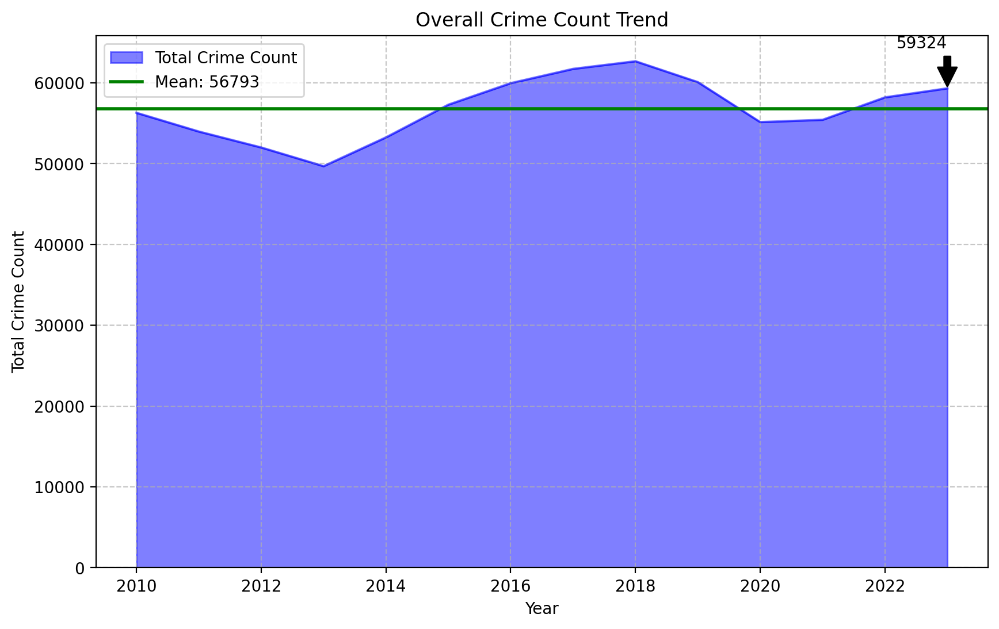

In [13]:
def endpoint_annotation(ax, overall_trend, offset=5000):
    """
    Adds an arrow annotation to highlight the final crime count on the plot.
    """
    final_year = overall_trend.index[-1]
    final_count = overall_trend.iloc[-1]
    
    ax.annotate(
        f'{final_count:.0f}',
        xy=(final_year, final_count),
        xytext=(final_year, final_count + offset), 
        arrowprops=dict(facecolor='black', shrink=0.05),
        horizontalalignment='right'
    )

overall_trend = crime_count.groupby('year')['count'].sum()
median = overall_trend.median()
mean = overall_trend.mean()

fig, ax = plt.subplots(figsize=(10,6))

#overall trend of crimes
overall_trend.plot(kind='area', alpha =0.5, color='b', label='Total Crime Count', ax=ax)
#mean line 
ax.axhline(y=mean, color='g', linestyle='-', linewidth=2, label=f'Mean: {mean:.0f}')
# Add gridlines
ax.grid(True, linestyle='--', alpha=0.7)

ax.legend()
endpoint_annotation(ax, overall_trend, offset=5000)
ax.set_title('Overall Crime Count Trend')
ax.set_xlabel('Year')
ax.set_ylabel('Total Crime Count')
plt.show()

The graph shows that the average yearly amount of crimes committed is 56793. We can also see that there is a trend up for crime, with 2023 ending over the mean with 59324 reported crimes. We have to keep in mind that the drop in crime between 2020 and 2021 was most likely caused by the Covid-19 pandemic. To sum this up, it looks like crime is about to be back to a level not seen in over 4 years.

## The LAPD's jurisdiction 
In 2019, the Los Angeles Police Department (LAPD) had a jurisdiction of 503 square miles and a population of 3,979,576. The LAPD is one of the largest police forces in Los Angeles County, along with the Los Angeles Sheriff's Department (LASD). Together, the two departments patrol 91% of the county's land and serve almost 70% of the county's population. 
Because this is such a large area, we have to keep in mind that some grouped areas are more densly populated than others or are larger in size. The interactive map below shows the the jurisdiction highlighted in blue and the Zone. 

In [1]:
from IPython.display import IFrame

html_file_path = 'map_with_zones.html'

IFrame(html_file_path, width=800, height=600)

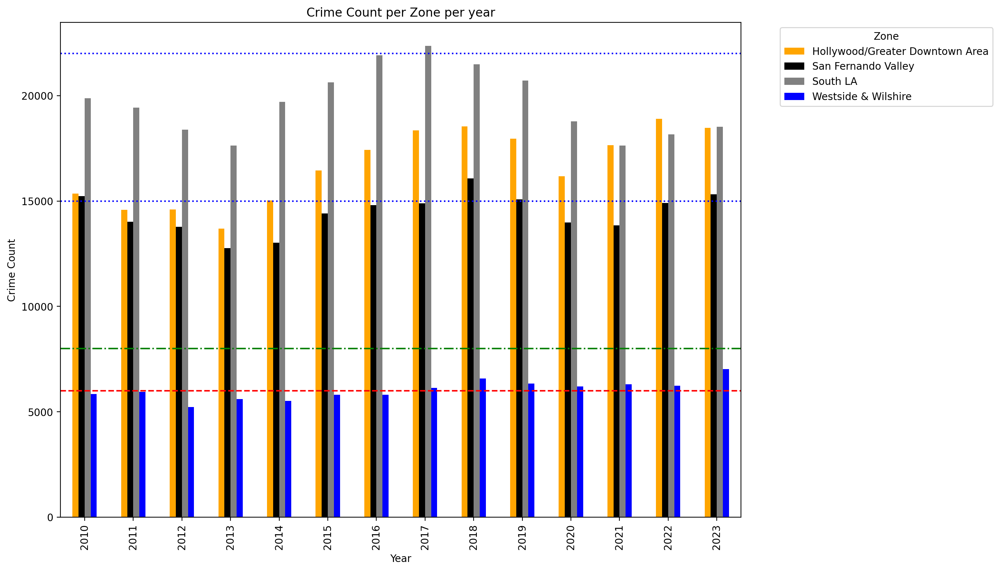

In [21]:
#1.1 Crime Counts per Zone

# While our previous step has shown that rates are back down to a level lower than in 2010, does this mean 
# Los Angeles is going to continue this trend or are there upticks within different zones. 
# Here I am trying to get a first look at the general crime occurences in each zone.

ax = crime_count_pivot.plot(kind='bar', figsize=(14,8))
plt.title('Crime Count per Zone per year')
plt.xlabel('Year')
plt.ylabel('Crime Count')
plt.legend(title='Zone', bbox_to_anchor=(1.05, 1), loc='upper left')

# Add horizontal marker lines
plt.axhline(y=6000, color='r', linestyle='--', label='Marker at 6000')
plt.axhline(y=8000, color='g', linestyle='-.', label='Marker at 8000')
plt.axhline(y=15000, color='b', linestyle=':', label='Marker at 15000')
plt.axhline(y=22000, color='b', linestyle=':', label='Marker at 22000')
plt.tight_layout()
plt.show()

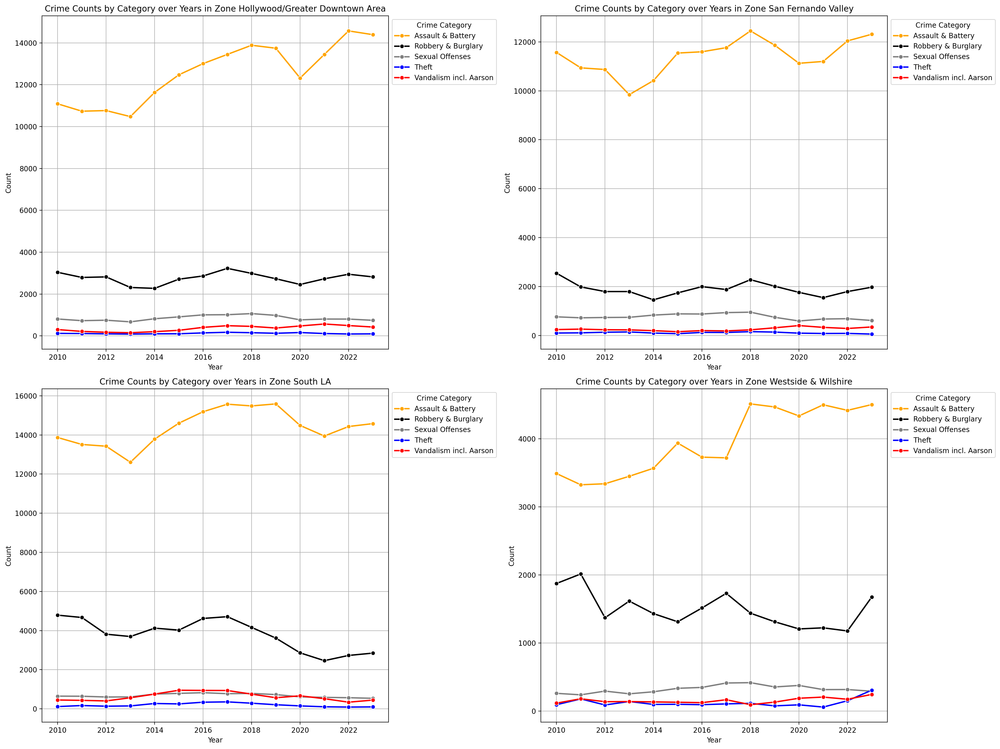

In [22]:
crime_counts = crime.groupby(['Zone', 'year', 'Crime Category']).size().unstack(fill_value=0)

# Reset index to get a DataFrame suitable for plotting
crime_counts = crime_counts.reset_index()

# Get unique zone names
unique_zones = crime_counts['Zone'].unique()

fig, axes = plt.subplots(2, 2, figsize=(20, 15))  # 3 rows, 2 columns
axes = axes.flatten()

# Plot each zone separately
for i, zone in enumerate(unique_zones):
    ax = axes[i]
    zone_data = crime_counts[crime_counts['Zone'] == zone].set_index('year')

    # Plot each crime category over the years
    for crime_category in zone_data.columns[1:]:
        sns.lineplot(data=zone_data, x=zone_data.index, y=crime_category, 
                     marker='o', linewidth=2, label=crime_category, ax=ax)
    
    ax.set_title(f'Crime Counts by Category over Years in Zone {zone}')
    ax.set_xlabel('Year')
    ax.set_ylabel('Count')
    ax.legend(title='Crime Category', bbox_to_anchor=(1, 1), loc='upper left')
    ax.grid(True)

plt.tight_layout()
plt.show()

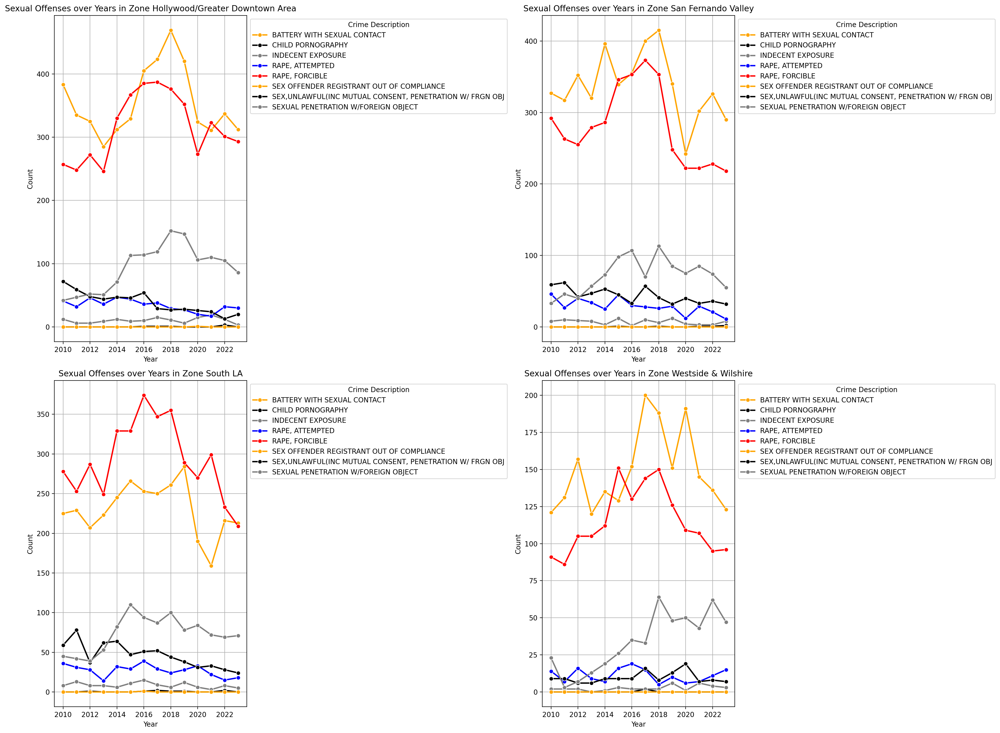

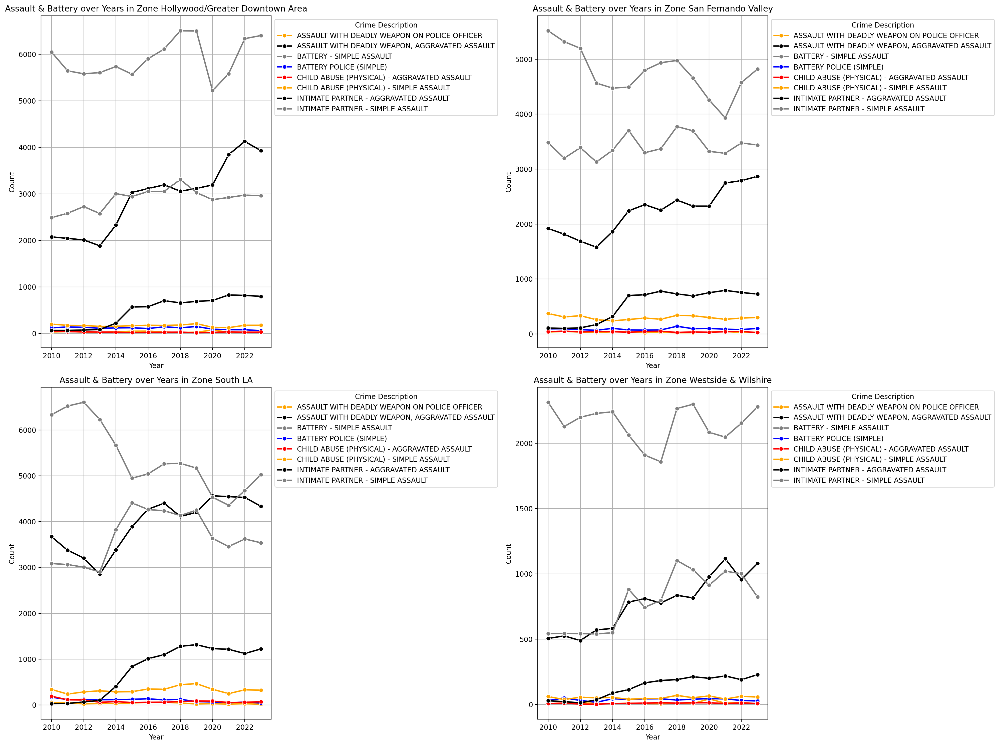

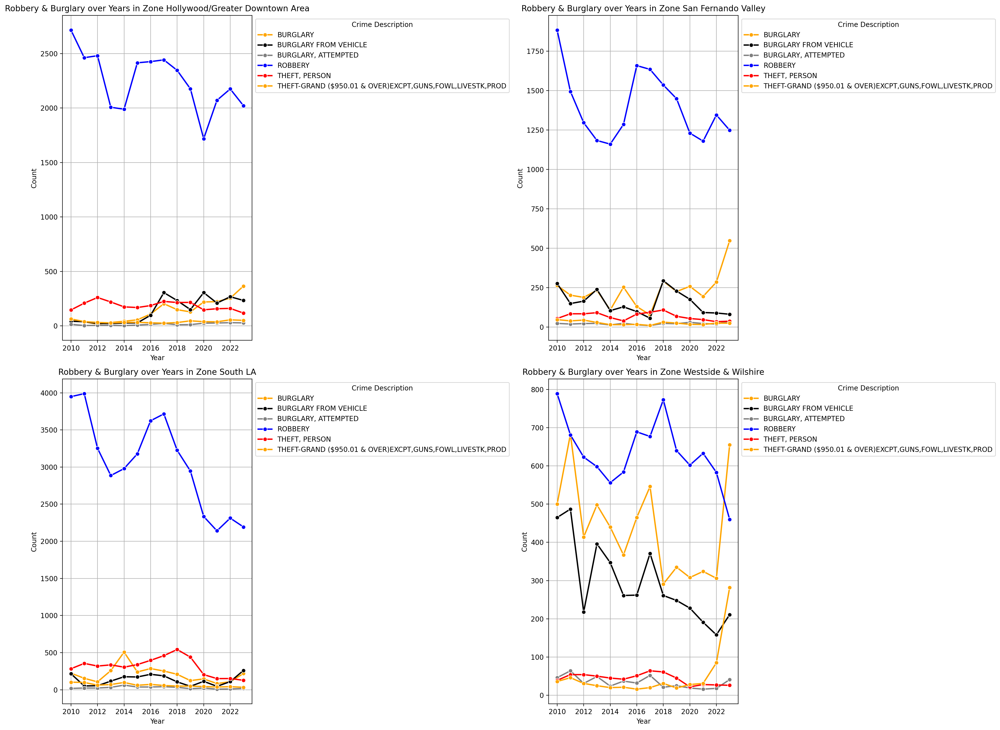

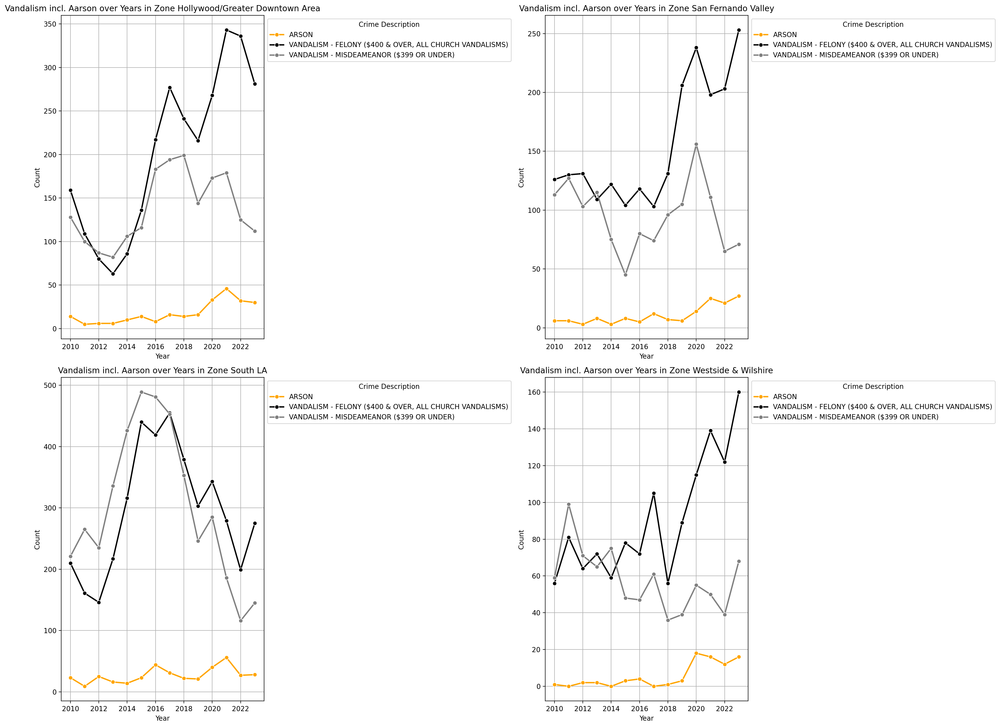

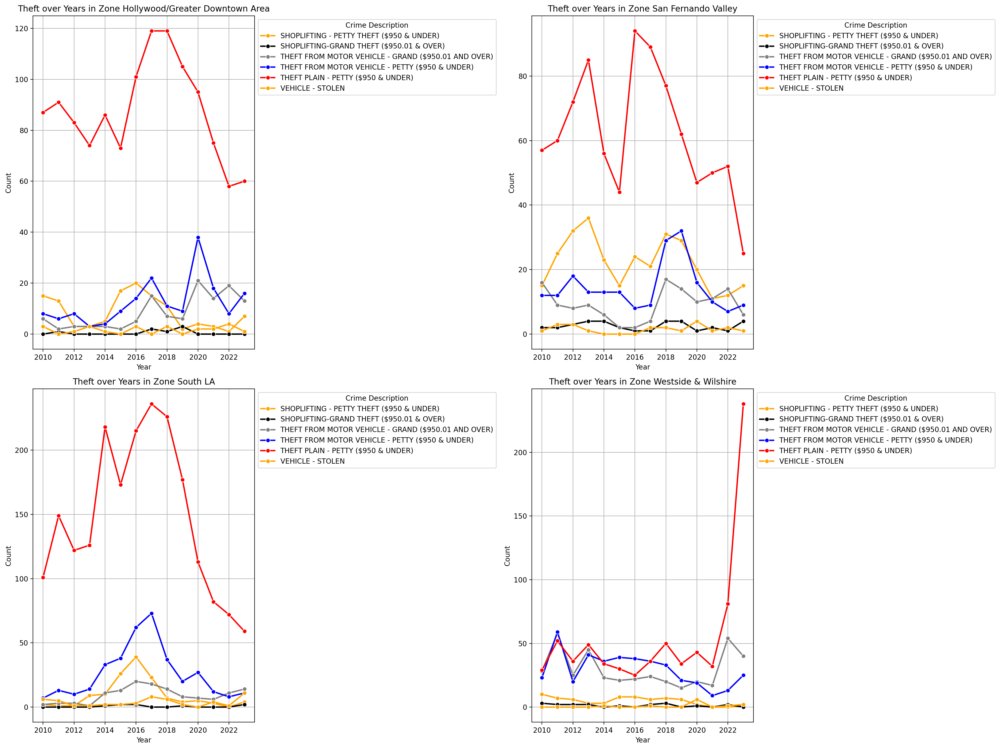

In [23]:
unique_categories = crime['Crime Category'].unique()

# Loop through each category and plot
for selected_category in unique_categories:
    # Filter for the selected crime category
    filtered_crime = crime[crime['Crime Category'] == selected_category]

    # Group by zone, year, and crime description
    crime_counts = filtered_crime.groupby(['Zone', 'year', 'Crime Code Description']).size().unstack(fill_value=0)

    # Reset index to get a DataFrame suitable for plotting
    crime_counts = crime_counts.reset_index()

    # Get unique zone names
    unique_zones = crime_counts['Zone'].unique()

    fig, axes = plt.subplots(2, 2, figsize=(20, 15))  # Adjust the number of rows and columns as needed
    axes = axes.flatten()

    # Plot each zone separately
    for i, zone in enumerate(unique_zones):
        if i >= len(axes):
            break
        ax = axes[i]
        zone_data = crime_counts[crime_counts['Zone'] == zone].set_index('year')

        # Plot each crime description over the years
        for crime_description in zone_data.columns[1:]:
            sns.lineplot(data=zone_data, x=zone_data.index, y=crime_description, 
                         marker='o', linewidth=2, label=crime_description, ax=ax)
        
        ax.set_title(f'{selected_category} over Years in Zone {zone}')
        ax.set_xlabel('Year')
        ax.set_ylabel('Count')
        ax.legend(title='Crime Description', bbox_to_anchor=(1, 1), loc='upper left')
        ax.grid(True)

    plt.tight_layout()
    plt.show()

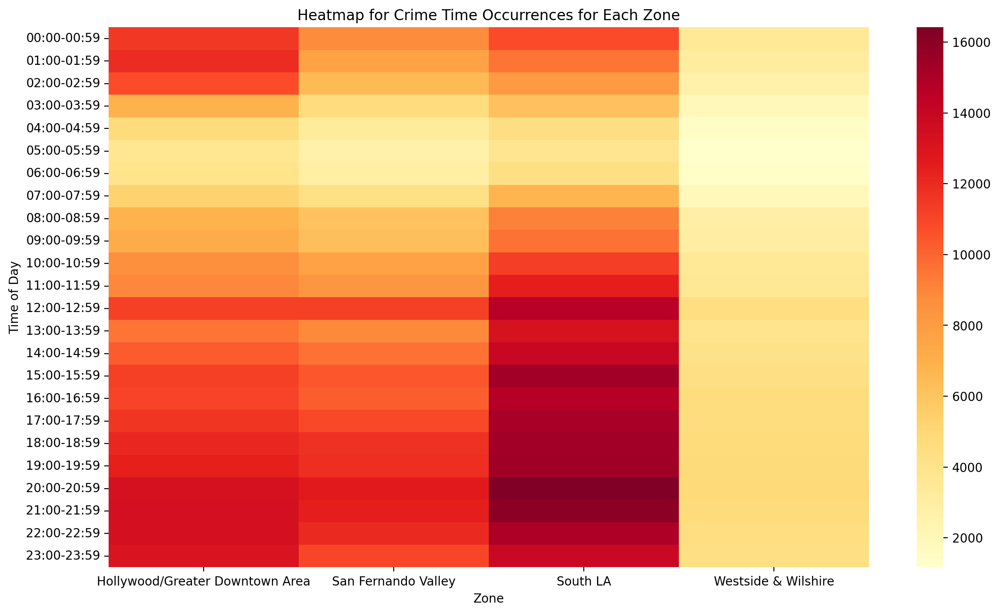

In [24]:
#1.4 When do these crimes occur general picture

crime['Hour_Block'] = crime['Time Occured'].dt.hour
crime['Hour_Block'] = crime['Hour_Block'].astype(str).str.zfill(2) + ':00-' + crime['Hour_Block'].astype(str).str.zfill(2) + ':59'
crime_counts = crime.groupby(['Zone', 'Hour_Block']).size().reset_index(name='Count')

# Pivot table for heatmap visualization
crime_pivot = crime_counts.pivot(index='Hour_Block', columns='Zone', values='Count').fillna(0)

# Plotting heatmap
plt.figure(figsize=(14, 8))
sns.heatmap(crime_pivot, cmap='YlOrRd', cbar=True)
plt.title('Heatmap for Crime Time Occurrences for Each Zone')
plt.xlabel('Zone')
plt.ylabel('Time of Day')
plt.show()

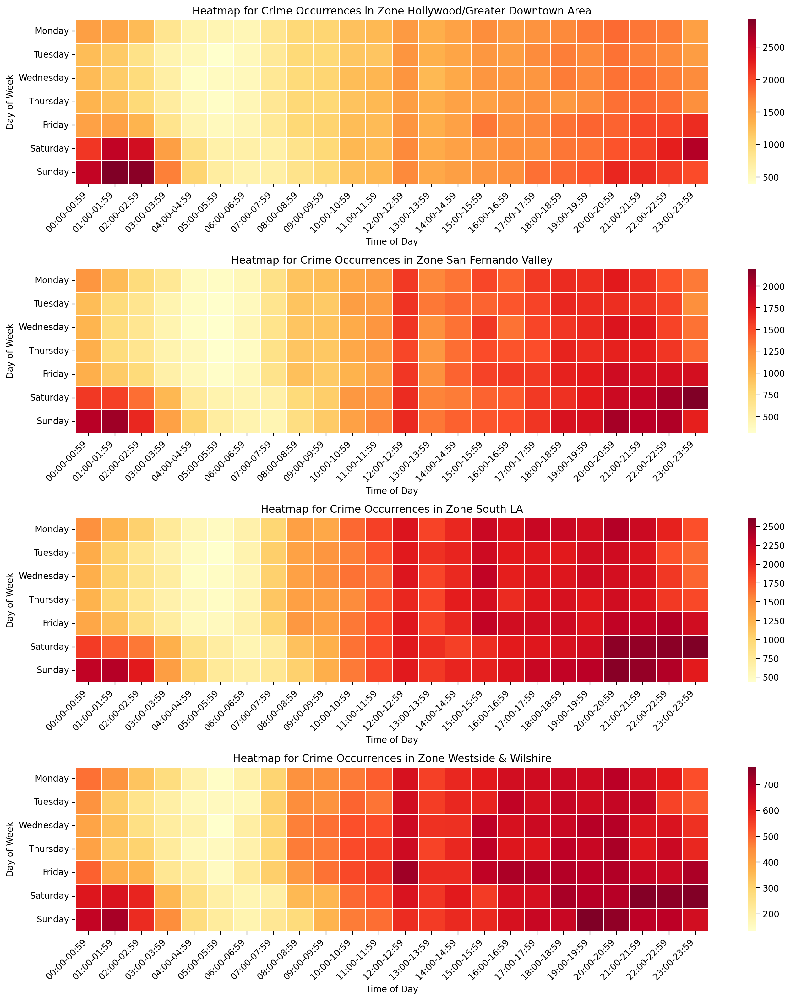

In [25]:
#1.4.1 Let's see if we can see a pattern for weekdays and the time of day
def crime_heatmap_by_zone(crime):
    crime['Hour_Block'] = crime['Time Occured'].dt.hour
    crime['Hour_Block'] = crime['Hour_Block'].astype(str).str.zfill(2) + ':00-' + crime['Hour_Block'].astype(str).str.zfill(2) + ':59'
    day_order=['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']
    crime['Weekday']= pd.Categorical(crime['Weekday'], categories=day_order, ordered = True)

    weekday_counts = crime.groupby(['Zone', 'Weekday', 'Hour_Block']).size().reset_index(name='count')
    
    zones=sorted(crime['Zone'].unique())
    n_zones=len(zones)
    
    fig, axes= plt.subplots(n_zones, 1, figsize=(14, n_zones * 4), sharex=False)
    
    for i,zone in enumerate(zones):
        zone_data = weekday_counts[weekday_counts['Zone']==zone]
        weekday_pivot = zone_data.pivot_table(index='Weekday', columns='Hour_Block', values='count', fill_value=0)
        sns.heatmap(weekday_pivot,cmap='YlOrRd' ,cbar=True, linewidths=.5, ax=axes[i])
        axes[i].set_title(f'Heatmap for Crime Occurrences in Zone {zone}')
        axes[i].set_xlabel('Time of Day')
        axes[i].set_ylabel('Day of Week')
        axes[i].set_xticklabels(weekday_pivot.columns, rotation=45, ha='right')
    plt.tight_layout()
    plt.show()
    
crime_heatmap_by_zone(crime)

/var/folders/0z/41_yxdy57v5gqbv0vhg6ky780000gn/T/ipykernel_48118/2888899398.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[i].set_xticklabels(zone_data['Hour_Block'].unique(), rotation=45, ha='right')
/var/folders/0z/41_yxdy57v5gqbv0vhg6ky780000gn/T/ipykernel_48118/2888899398.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[i].set_xticklabels(zone_data['Hour_Block'].unique(), rotation=45, ha='right')
/var/folders/0z/41_yxdy57v5gqbv0vhg6ky780000gn/T/ipykernel_48118/2888899398.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[i].set_xticklabels(zone_data['Hour_Block'].unique(), rotation=45, ha='right')
/var/folders/0z/41_yxdy57v5gqbv0vhg6ky780000gn/T/ipykernel_48118/2888899398.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[i].set_xticklabels(zone_data['Hour_Block'].unique(), rotation=45, ha='right')


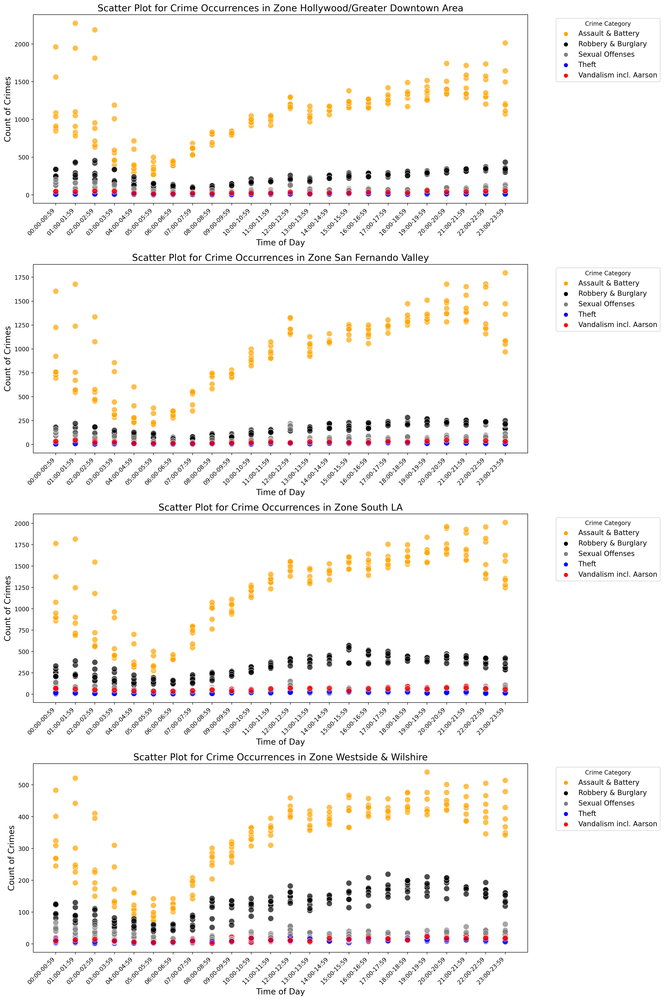

In [26]:
def crime_scatter_by_zone(crime):
    crime['Hour_Block'] = crime['Time Occured'].dt.hour
    crime['Hour_Block'] = crime['Hour_Block'].astype(str).str.zfill(2) + ':00-' + crime['Hour_Block'].astype(str).str.zfill(2) + ':59'
    day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
    crime['Weekday'] = pd.Categorical(crime['Weekday'], categories=day_order, ordered=True)

    weekday_counts = crime.groupby(['Zone', 'Weekday', 'Hour_Block', 'Crime Category']).size().reset_index(name='count')
    
    zones = sorted(crime['Zone'].unique())
    n_zones = len(zones)
    
    fig, axes = plt.subplots(n_zones, 1, figsize=(16, n_zones * 6), sharex=False)  # Increased height for visibility
    
    for i, zone in enumerate(zones):
        zone_data = weekday_counts[weekday_counts['Zone'] == zone]
        
        # Scatter plot for each zone
        sns.scatterplot(data=zone_data, x='Hour_Block', y='count', hue='Crime Category', ax=axes[i], alpha=0.7, s=100)  # Increased point size
        
        axes[i].set_title(f'Scatter Plot for Crime Occurrences in Zone {zone}', fontsize=16)
        axes[i].set_xlabel('Time of Day', fontsize=14)
        axes[i].set_ylabel('Count of Crimes', fontsize=14)
        axes[i].set_xticklabels(zone_data['Hour_Block'].unique(), rotation=45, ha='right')

        # Move legend outside the subplot
        axes[i].legend(title='Crime Category', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12)
    
    plt.tight_layout()
    plt.show()

crime_scatter_by_zone(crime)

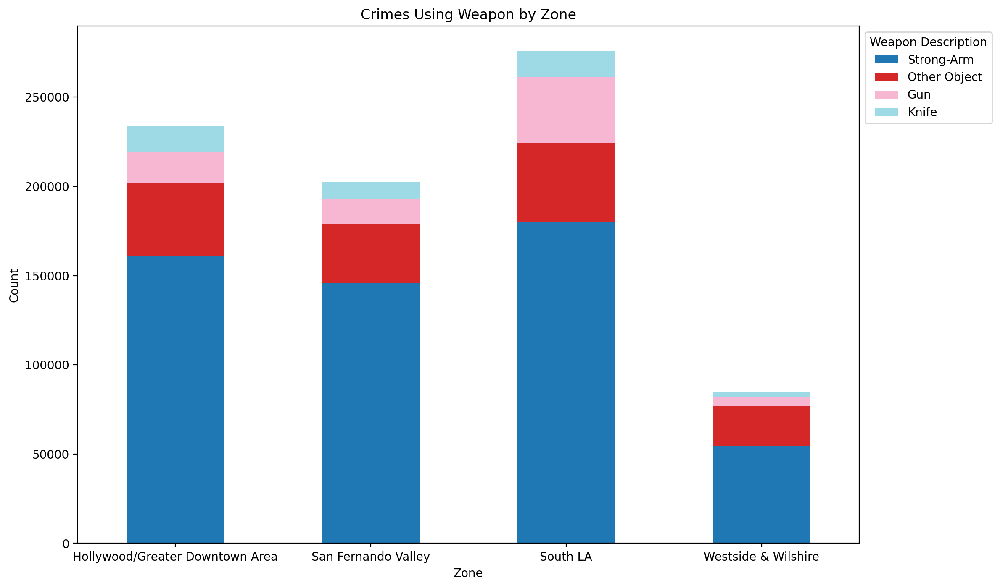

In [34]:
weapon_counts = crime.groupby(['Zone', 'Weapon Category']).size().reset_index(name='count')

#There are plenty of weapon descriptions and we are running into
# an issue that it might clutter our chart. Let's specify the top 10

def top_n_items(df, n=10, column='count'):
    return df.sort_values(by=column, ascending=False).head(n)


top_weapons = weapon_counts.groupby('Zone').apply(top_n_items).reset_index(drop=True)

top_weapons_pivot = weapon_counts.pivot_table(index=['Zone'], columns = ['Weapon Category'], values = 'count', aggfunc='sum', fill_value=0)
top_weapons_pivot = top_weapons_pivot.apply(lambda x: x.nlargest(10), axis=1)

plt.figure(figsize=(12,8))
top_weapons_pivot.plot(kind='bar', stacked = True, cmap='tab20', ax=plt.gca())

plt.title('Crimes Using Weapon by Zone')
plt.xlabel('Zone')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.legend(title='Weapon Description', bbox_to_anchor=(1, 1), loc='upper left')
plt.show()


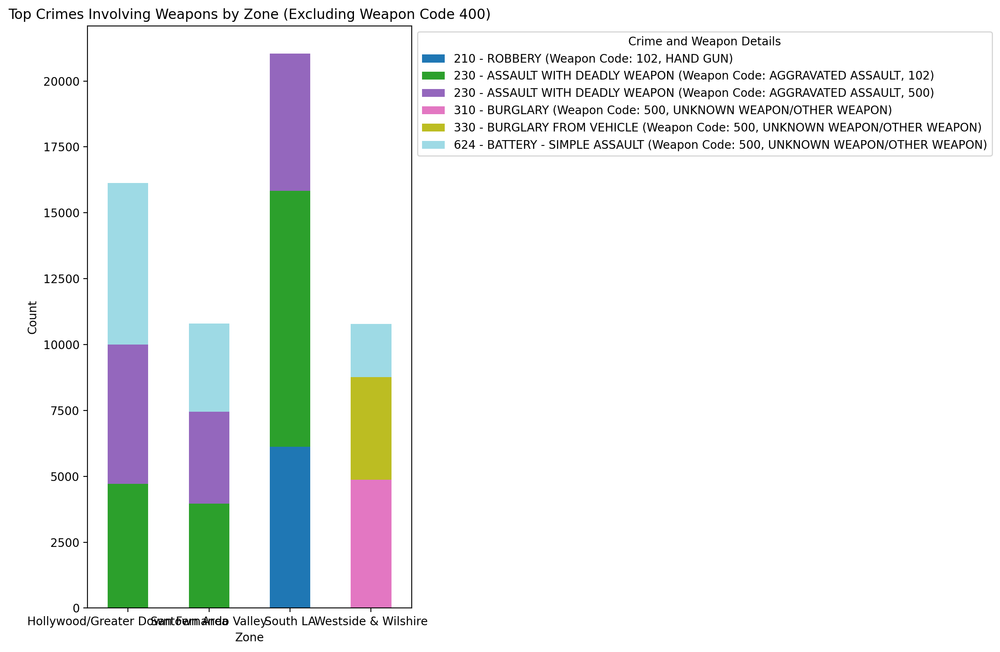

In [35]:
# Exclude weapon code 400
no_400 = crime[(crime['Weapon Used Cd'] != 400)]

# Group by Zone, Crime Code, Crime Description, Weapon Used Code, and Weapon Description
no_400_count = no_400.groupby(['Zone', 'Crime Code', 'Crime Code Description', 'Weapon Used Cd', 'Weapon Desc']).size().reset_index(name='count')

# Function to get top N items
def top_n_items(x, n=3):
    return x.nlargest(n, 'count')

# Get top crimes involving weapons for each zone
top_crimes_weapon = no_400_count.groupby('Zone').apply(top_n_items).reset_index(drop=True)

# Pivot table for plotting
top_crimes_weapon_pivot = top_crimes_weapon.pivot_table(index='Zone', 
                                                          columns=['Crime Code', 'Crime Code Description', 'Weapon Used Cd', 'Weapon Desc'], 
                                                          values='count', 
                                                          aggfunc='sum', 
                                                          fill_value=0)

# Plotting
plt.figure(figsize=(12, 8))
top_crimes_weapon_pivot.plot(kind='bar', stacked=True, cmap='tab20', ax=plt.gca())

plt.title('Top Crimes Involving Weapons by Zone (Excluding Weapon Code 400)')
plt.xlabel('Zone')
plt.ylabel('Count')
plt.xticks(rotation=0)

# Customizing legend
handles, labels = plt.gca().get_legend_handles_labels()
new_labels = []
for label in labels:
    parts = label.split(', ')
    if len(parts) >= 4:
        crime_code, crime_desc, weapon_code, weapon_desc = parts[:4]
        new_labels.append(f"{crime_code.strip('()')} - {crime_desc.strip('()')} (Weapon Code: {weapon_code.strip('()')}, {weapon_desc.strip('()')})")
    else:
        new_labels.append(label)  # Fallback in case of unexpected format

plt.legend(handles, new_labels, title='Crime and Weapon Details', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

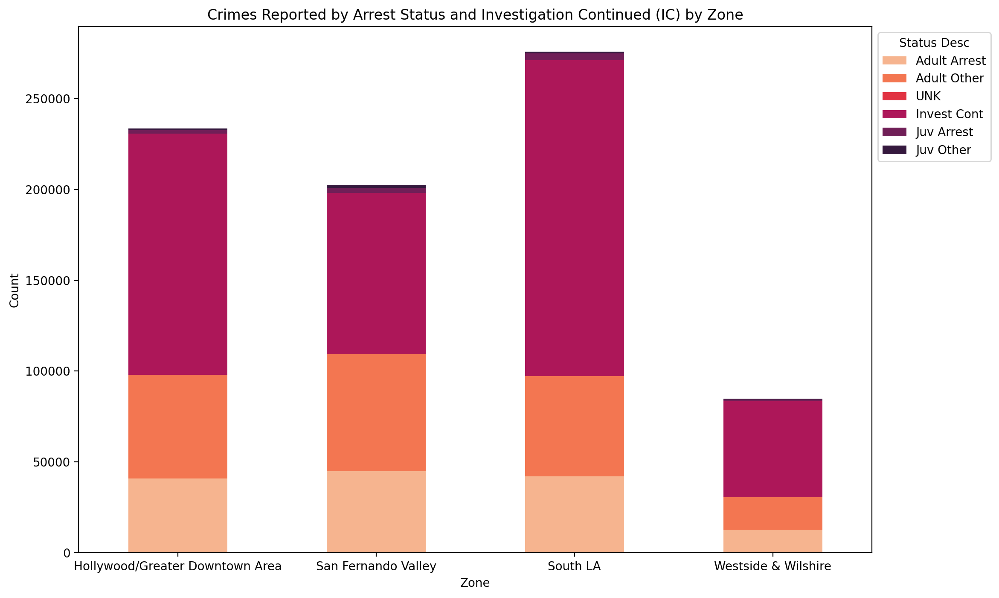

In [36]:
#1.6 How many Arrests are made, how many Investigations are continued
# Count incidents per zone and status
crime_counts = crime.groupby(['Zone', 'Status']).size().unstack(fill_value=0)

# Plotting stacked bar chart
plt.figure(figsize=(12, 8))
crime_counts.plot(kind='bar', stacked=True,  ax=plt.gca())
plt.title('Crimes Reported by Arrest Status and Investigation Continued (IC) by Zone')
plt.xlabel('Zone')
plt.ylabel('Count')

handles, labels = plt.gca().get_legend_handles_labels()
status_desc_mapping = crime[['Status', 'Status Desc']].drop_duplicates().set_index('Status')['Status Desc'].to_dict()
labels = [status_desc_mapping.get(status, status) for status in labels]
plt.legend(handles, labels, title='Status Desc', bbox_to_anchor=(1, 1), loc='upper left')

plt.xticks(rotation=0)
plt.show()

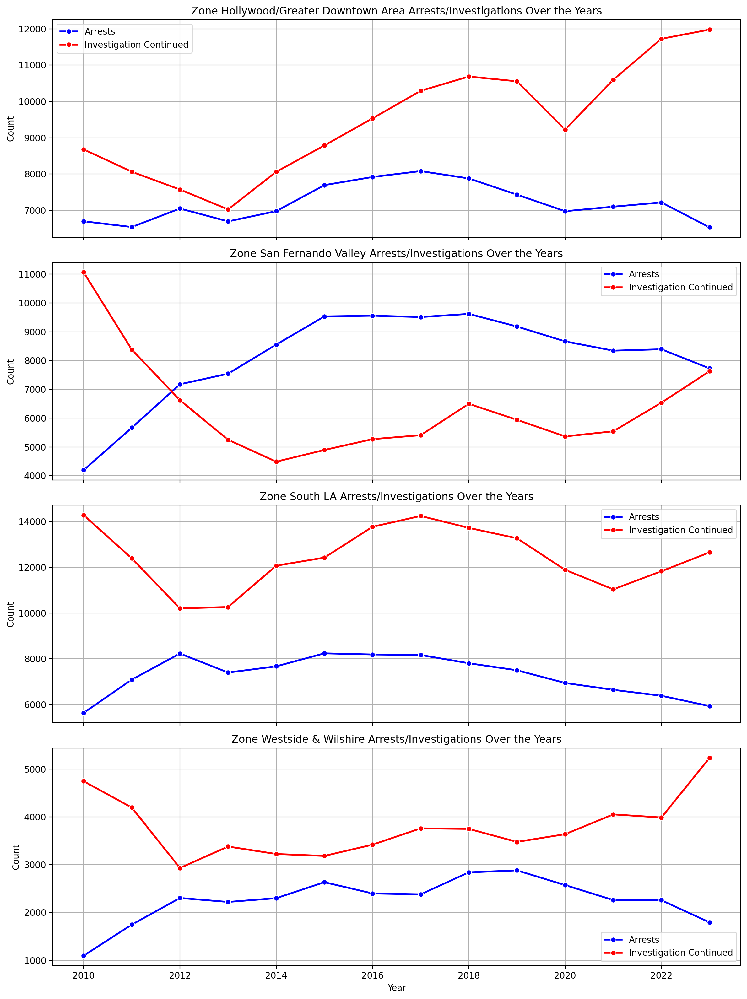

In [37]:
# How has LAPD performed over the years with their arrests, by zone
# compared to investigations continued

def zones_arrest_rate(crime):

    arrest_data = crime[crime['Status'].isin((['AA', 'AO', 'JA', 'JO']))]
    arrest_counts = arrest_data.groupby(['Zone','year']).size().reset_index(name='Arrests')
    
    investigation_data = crime[crime['Status'] == 'IC']
    investigation_counts = investigation_data.groupby(['Zone','year']).size().reset_index(name='Investigations')

    merged_data = pd.merge(arrest_counts, investigation_counts, on=['Zone','year'], how='outer').fillna(0)

    #create grid of plots for each zone
    zones= merged_data['Zone'].unique()
    n_zones= len(zones)

    fig, axes =plt.subplots(n_zones,1,figsize=(12,n_zones *4),sharex=True)

    for i, zone in enumerate(zones):
        zone_data = merged_data[merged_data['Zone']== zone]
        sns.lineplot(data=zone_data, x='year', y='Arrests', marker='o', color='b', linewidth =2, label = 'Arrests', ax=axes[i])
        sns.lineplot(data = zone_data, x='year', y='Investigations', marker = 'o', color='r', linewidth=2, label='Investigation Continued', ax=axes[i])
    
        
        axes[i].set_title(f'Zone {zone} Arrests/Investigations Over the Years')
        axes[i].set_xlabel('Year')
        axes[i].set_ylabel('Count')
        axes[i].legend()
        axes[i].grid(True)   

    plt.tight_layout()
    plt.show()
    
zones_arrest_rate(crime)

Zone Hollywood/Greater Downtown Area Arrest Rate by Victim Descent:
 - Victim Descent: A, Arrest Rate: 41.60%
 - Victim Descent: B, Arrest Rate: 41.42%
 - Victim Descent: H, Arrest Rate: 45.71%
 - Victim Descent: O, Arrest Rate: 39.88%
 - Victim Descent: W, Arrest Rate: 38.55%
Total Arrest Rate for Zone Hollywood/Greater Downtown Area: 43.16%



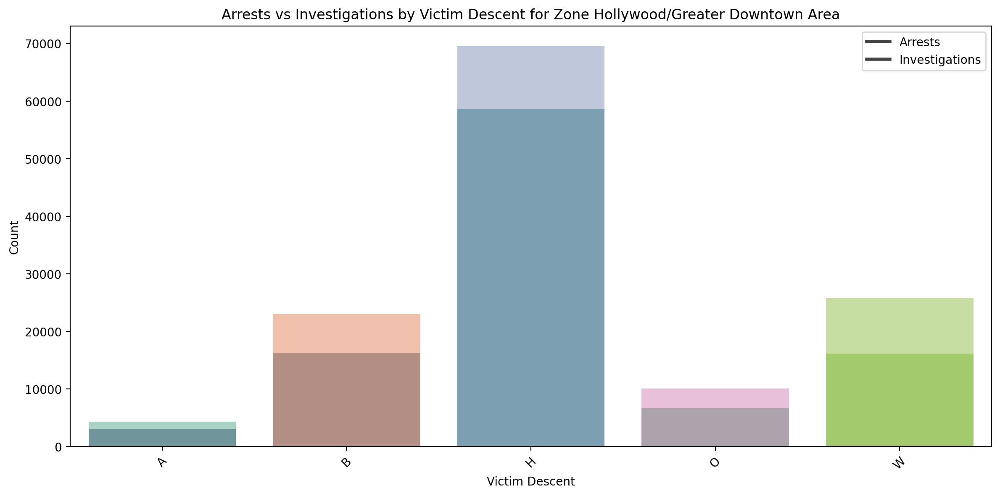

Zone San Fernando Valley Arrest Rate by Victim Descent:
 - Victim Descent: A, Arrest Rate: 54.98%
 - Victim Descent: B, Arrest Rate: 60.21%
 - Victim Descent: H, Arrest Rate: 56.05%
 - Victim Descent: O, Arrest Rate: 52.46%
 - Victim Descent: W, Arrest Rate: 56.18%
Total Arrest Rate for Zone San Fernando Valley: 56.11%



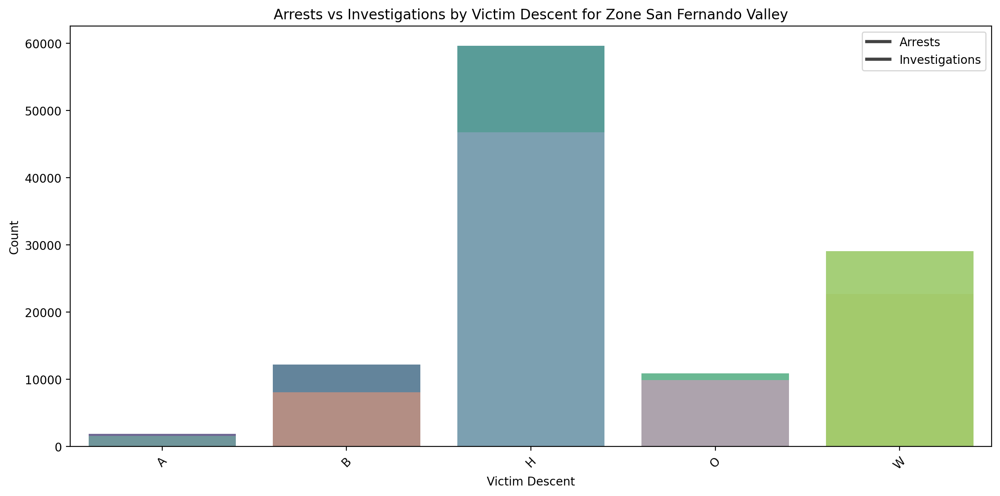

Zone South LA Arrest Rate by Victim Descent:
 - Victim Descent: A, Arrest Rate: 33.43%
 - Victim Descent: B, Arrest Rate: 37.07%
 - Victim Descent: H, Arrest Rate: 36.32%
 - Victim Descent: O, Arrest Rate: 35.81%
 - Victim Descent: W, Arrest Rate: 41.54%
Total Arrest Rate for Zone South LA: 36.91%



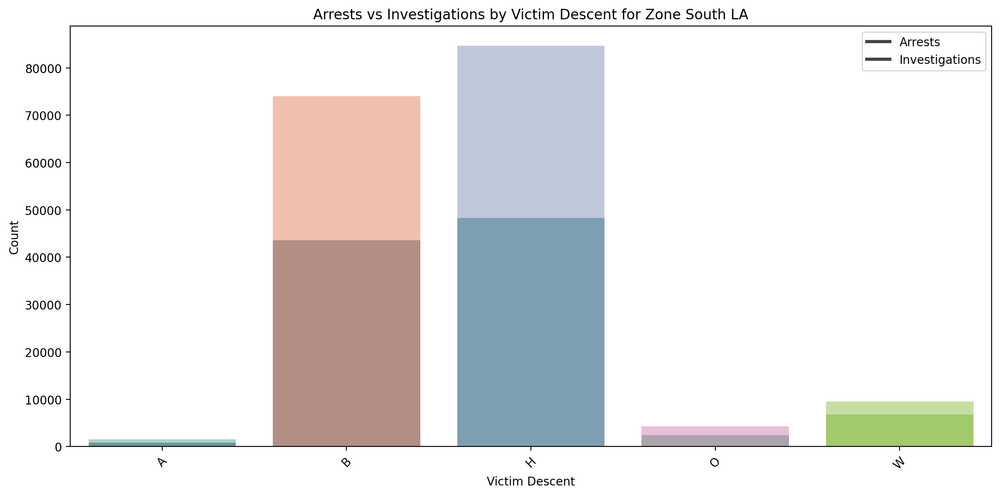

Zone Westside & Wilshire Arrest Rate by Victim Descent:
 - Victim Descent: A, Arrest Rate: 33.64%
 - Victim Descent: B, Arrest Rate: 41.73%
 - Victim Descent: H, Arrest Rate: 38.98%
 - Victim Descent: O, Arrest Rate: 36.55%
 - Victim Descent: W, Arrest Rate: 34.84%
Total Arrest Rate for Zone Westside & Wilshire: 37.43%



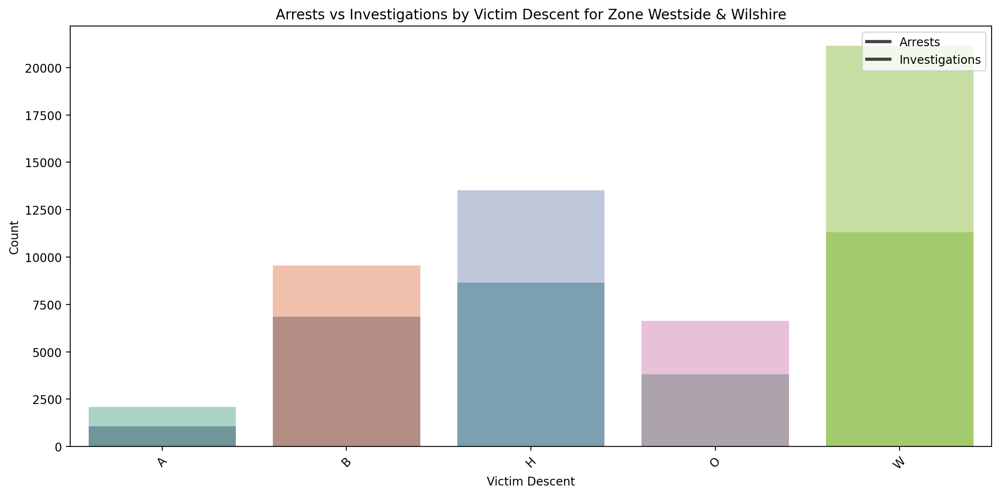

In [38]:
def zones_arrest_rate_by_race(crime):
    # Filter data for arrests and investigations
    arrest_data = crime[crime['Status'].isin(['AA', 'AO', 'JA', 'JO'])]
    arrest_counts = arrest_data.groupby(['Zone', 'Vict Descent']).size().reset_index(name='Arrests')
    
    investigation_data = crime[crime['Status'] == 'IC']
    investigation_counts = investigation_data.groupby(['Zone', 'Vict Descent']).size().reset_index(name='Investigations')

    # Merge data to get counts for each zone and victim descent
    merged_data = pd.merge(arrest_counts, investigation_counts, on=['Zone', 'Vict Descent'], how='outer').fillna(0)

    # Calculate arrest rate and plot bar charts for each zone
    zones = merged_data['Zone'].unique()
    n_zones = len(zones)
    
    for i, zone in enumerate(zones):
        zone_data = merged_data[merged_data['Zone'] == zone]
        
        # Plot bar chart for counts by victim descent and zone
        fig, ax = plt.subplots(figsize=(12, 6))
        
        sns.barplot(data=zone_data, x='Vict Descent', y='Arrests', palette='viridis', alpha=0.8, ax=ax)
        sns.barplot(data=zone_data, x='Vict Descent', y='Investigations', palette='Set2', alpha=0.6, estimator=sum, errcolor=None, ax=ax)
        
        ax.set_title(f'Arrests vs Investigations by Victim Descent for Zone {zone}')
        ax.set_xlabel('Victim Descent')
        ax.set_ylabel('Count')
        ax.legend(['Arrests', 'Investigations'], loc='upper right')
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45)  # Rotate x-axis labels
        
        # Calculate and print arrest rates
        total_arrests = zone_data['Arrests'].sum()
        total_investigations = zone_data['Investigations'].sum()
        total_crimes = total_arrests + total_investigations
        arrest_rate = total_arrests / total_crimes if total_crimes > 0 else 0
        
        print(f"Zone {zone} Arrest Rate by Victim Descent:")
        for idx, row in zone_data.iterrows():
            victim_descent = row['Vict Descent']
            arrests = row['Arrests']
            investigations = row['Investigations']
            arrest_rate_victim = arrests / (arrests + investigations) if (arrests + investigations) > 0 else 0
            print(f" - Victim Descent: {victim_descent}, Arrest Rate: {arrest_rate_victim:.2%}")

        print(f"Total Arrest Rate for Zone {zone}: {arrest_rate:.2%}")
        print()
        
        plt.tight_layout()
        plt.show()


zones_arrest_rate_by_race(crime)

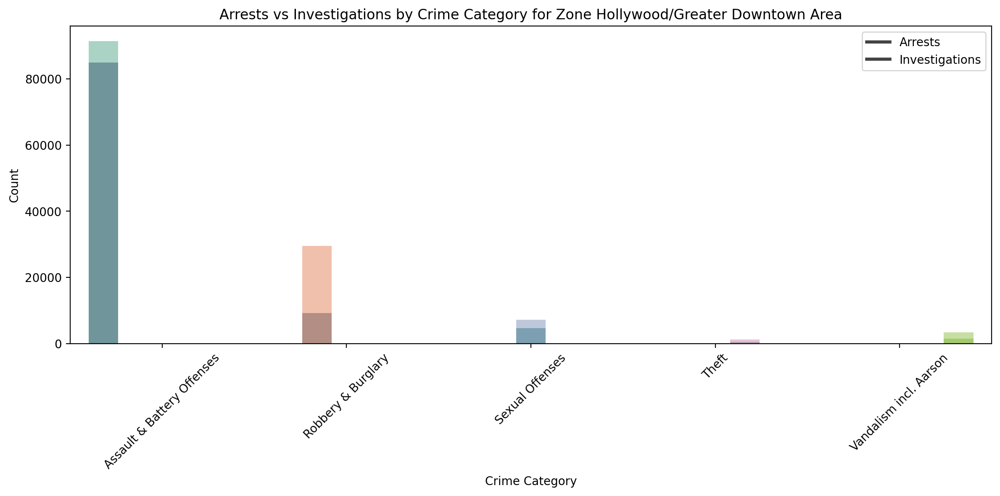

Zone Hollywood/Greater Downtown Area Arrest Rate by Crime Category:
 - Crime Category: Assault & Battery Offenses, Arrests: 84982, Investigations: 91369, Arrest Rate: 48.19%
 - Crime Category: Robbery & Burglary, Arrests: 9206, Investigations: 29489, Arrest Rate: 23.79%
 - Crime Category: Sexual Offenses, Arrests: 4665, Investigations: 7207, Arrest Rate: 39.29%
 - Crime Category: Theft, Arrests: 413, Investigations: 1256, Arrest Rate: 24.75%
 - Crime Category: Vandalism incl. Aarson, Arrests: 1538, Investigations: 3454, Arrest Rate: 30.81%



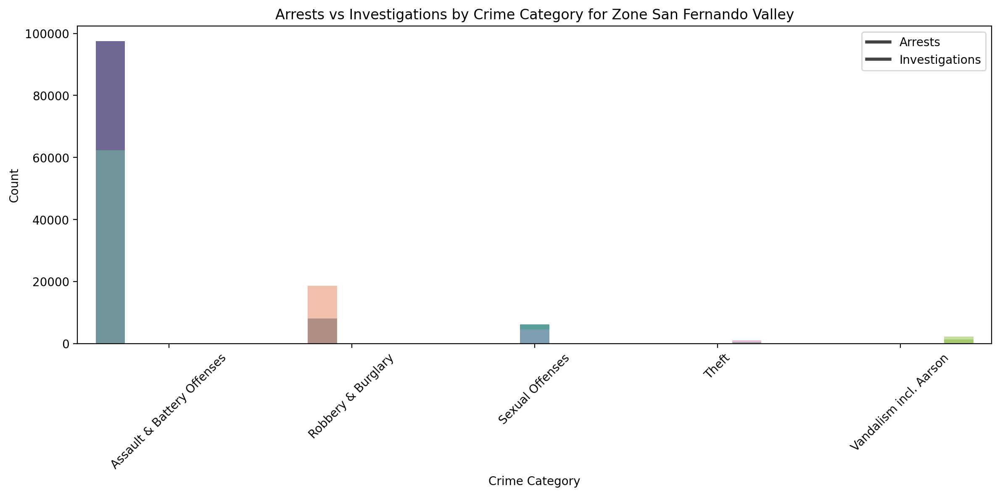

Zone San Fernando Valley Arrest Rate by Crime Category:
 - Crime Category: Assault & Battery Offenses, Arrests: 97480, Investigations: 62392, Arrest Rate: 60.97%
 - Crime Category: Robbery & Burglary, Arrests: 8038, Investigations: 18588, Arrest Rate: 30.19%
 - Crime Category: Sexual Offenses, Arrests: 6242, Investigations: 4572, Arrest Rate: 57.72%
 - Crime Category: Theft, Arrests: 533, Investigations: 1031, Arrest Rate: 34.08%
 - Crime Category: Vandalism incl. Aarson, Arrests: 1356, Investigations: 2304, Arrest Rate: 37.05%



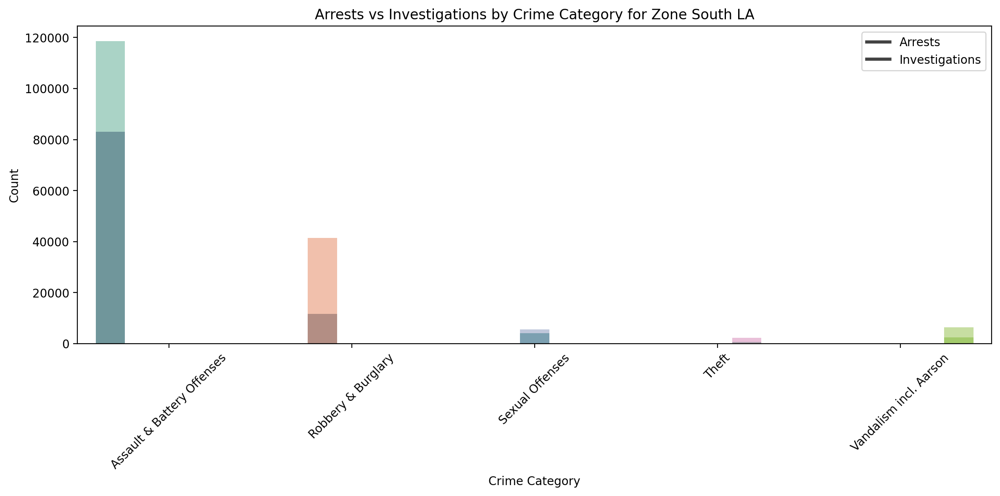

Zone South LA Arrest Rate by Crime Category:
 - Crime Category: Assault & Battery Offenses, Arrests: 83114, Investigations: 118548, Arrest Rate: 41.21%
 - Crime Category: Robbery & Burglary, Arrests: 11717, Investigations: 41480, Arrest Rate: 22.03%
 - Crime Category: Sexual Offenses, Arrests: 3999, Investigations: 5515, Arrest Rate: 42.03%
 - Crime Category: Theft, Arrests: 575, Investigations: 2185, Arrest Rate: 20.83%
 - Crime Category: Vandalism incl. Aarson, Arrests: 2434, Investigations: 6330, Arrest Rate: 27.77%



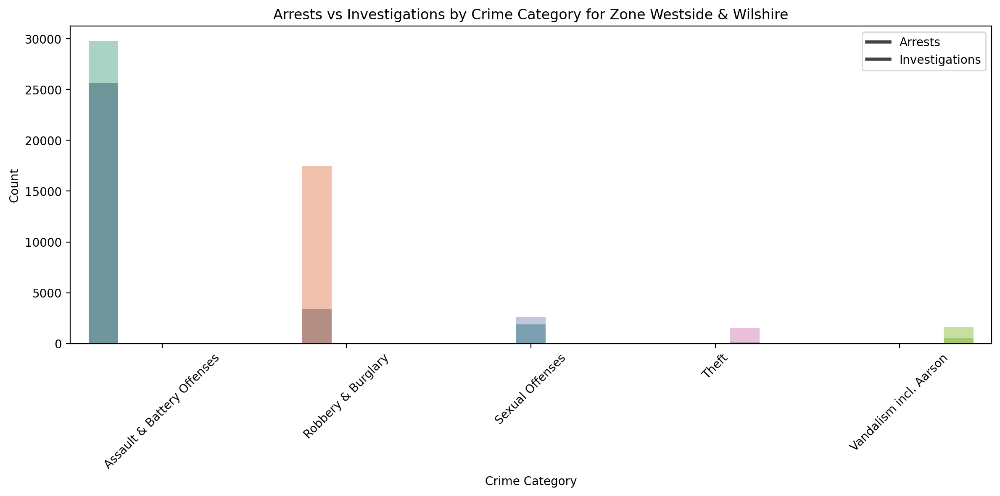

Zone Westside & Wilshire Arrest Rate by Crime Category:
 - Crime Category: Assault & Battery Offenses, Arrests: 25642, Investigations: 29746, Arrest Rate: 46.30%
 - Crime Category: Robbery & Burglary, Arrests: 3418, Investigations: 17492, Arrest Rate: 16.35%
 - Crime Category: Sexual Offenses, Arrests: 1903, Investigations: 2591, Arrest Rate: 42.35%
 - Crime Category: Theft, Arrests: 151, Investigations: 1538, Arrest Rate: 8.94%
 - Crime Category: Vandalism incl. Aarson, Arrests: 563, Investigations: 1595, Arrest Rate: 26.09%



In [39]:
def zones_arrest_rate_by_category(crime):
    # Filter data for arrests and investigations
    arrest_data = crime[crime['Status'].isin(['AA', 'AO', 'JA', 'JO'])]
    arrest_counts = arrest_data.groupby(['Zone', 'Crime Category']).size().reset_index(name='Arrests')
    
    investigation_data = crime[crime['Status'] == 'IC']
    investigation_counts = investigation_data.groupby(['Zone', 'Crime Category']).size().reset_index(name='Investigations')

    # Merge data to get counts for each zone and crime
    merged_data = pd.merge(arrest_counts, investigation_counts, on=['Zone', 'Crime Category'], how='outer').fillna(0)

    # Calculate arrest rate
    merged_data['Arrest Rate'] = merged_data['Arrests'] / (merged_data['Arrests'] + merged_data['Investigations'])

    # Print arrest rates by zone and crime
    zones = merged_data['Zone'].unique()
    
    for zone in zones:
        zone_data = merged_data[merged_data['Zone'] == zone]
        
        # Plot bar chart for counts by crime category and zone
        fig, ax = plt.subplots(figsize=(12, 6))
        
        sns.barplot(data=zone_data, x='Crime Category', y='Arrests', hue='Crime Category', palette='viridis', alpha=0.8, ax=ax)
        sns.barplot(data=zone_data, x='Crime Category', y='Investigations', hue='Crime Category', palette='Set2', alpha=0.6, estimator=sum, errcolor=None, ax=ax)
        
        ax.set_title(f'Arrests vs Investigations by Crime Category for Zone {zone}')
        ax.set_xlabel('Crime Category')
        ax.set_ylabel('Count')
        ax.legend(['Arrests', 'Investigations'], loc='upper right')
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45)  # Rotate x-axis labels
        
        plt.tight_layout()
        plt.show()

        # Calculate and print arrest rates by crime type
        print(f"Zone {zone} Arrest Rate by Crime Category:")
        for idx, row in zone_data.iterrows():
            crime_category = row['Crime Category']
            arrests = row['Arrests']
            investigations = row['Investigations']
            arrest_rate_crime = arrests / (arrests + investigations) if (arrests + investigations) > 0 else 0
            print(f" - Crime Category: {crime_category}, Arrests: {arrests}, Investigations: {investigations}, Arrest Rate: {arrest_rate_crime:.2%}")

        print()

# Example usage with crime DataFrame
zones_arrest_rate_by_category(crime)